In [1]:
from PIL import Image
import numpy as np

In [2]:
def convert(input):
    image = (input / 2 + 0.5).clamp(0, 1).squeeze()
    image = (image.permute(1, 2, 0) * 255).round().to(torch.uint8).cpu().numpy()
    image = Image.fromarray(image)
    return image

In [3]:
from diffusers import DDPMScheduler, UNet2DModel
from diffusers import UniPCMultistepScheduler

# scheduler = UniPCMultistepScheduler.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="scheduler")

scheduler = DDPMScheduler.from_pretrained("google/ddpm-cat-256")
model = UNet2DModel.from_pretrained("google/ddpm-cat-256", use_safetensors=True).to("cuda")

In [4]:
scheduler.set_timesteps(50)

In [5]:
scheduler.timesteps

tensor([980, 960, 940, 920, 900, 880, 860, 840, 820, 800, 780, 760, 740, 720,
        700, 680, 660, 640, 620, 600, 580, 560, 540, 520, 500, 480, 460, 440,
        420, 400, 380, 360, 340, 320, 300, 280, 260, 240, 220, 200, 180, 160,
        140, 120, 100,  80,  60,  40,  20,   0])

In [6]:
import torch

sample_size = model.config.sample_size
noise = torch.randn((1, 3, sample_size, sample_size)).to("cuda")

In [7]:
sample_size

256

In [8]:
# from PIL import Image
# import matplotlib.pyplot as plt
# from torchvision import transforms
# noise = Image.open(r"C:\Users\aviator\Downloads\NOISY_SRGB_010.PNG")
# noise=noise.resize((512,512))
# # plt.imshow(transforms.ToPILImage()(transforms.ToTensor()(noise)), interpolation="bicubic")

In [9]:
# noise=(transforms.ToTensor()(noise)).to("cuda")
# noise = noise.unsqueeze(0)

In [10]:
noise

tensor([[[[ 0.5973, -0.0327,  0.8109,  ...,  0.6326, -0.3014,  1.7264],
          [ 1.1307,  0.3135,  1.5670,  ...,  1.5349, -0.0339, -0.4335],
          [-0.7970, -1.0460, -0.5821,  ..., -0.3509,  0.6759, -0.4041],
          ...,
          [-0.9280,  0.0878, -0.3098,  ..., -2.1059,  0.6642,  1.4242],
          [ 0.2430, -0.3786, -0.2392,  ...,  0.1540,  0.6709, -1.3930],
          [-0.4956,  2.7170, -1.4473,  ...,  1.0330, -0.1263, -1.6817]],

         [[-1.0573,  2.0359, -0.2054,  ..., -1.5426, -0.8011, -1.9678],
          [-1.0373, -0.2082, -0.0148,  ..., -0.4633, -0.4067, -0.8803],
          [ 0.4979,  1.5529, -1.4526,  ..., -1.0201, -1.3787,  0.0706],
          ...,
          [ 0.4627, -1.9878,  0.4252,  ..., -0.9719, -0.8652, -0.9296],
          [ 0.7454, -0.3227,  0.0542,  ...,  0.2961, -0.7950, -0.5718],
          [ 1.7559, -0.3352,  0.7164,  ..., -0.5494,  0.6710,  0.0304]],

         [[ 1.1256,  0.0358,  2.0032,  ..., -1.4084, -0.1415,  1.3122],
          [-0.6291, -1.3171,  

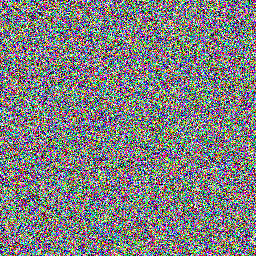

In [11]:
imgg=convert(noise)
imgg

torch.Size([1, 3, 256, 256])
tensor(980)


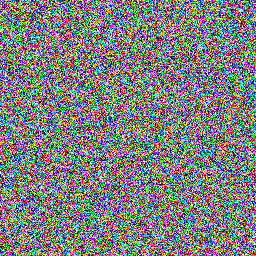

tensor(960)


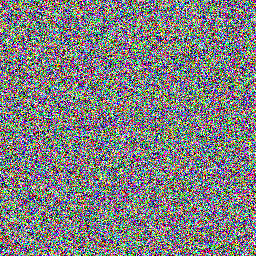

tensor(940)


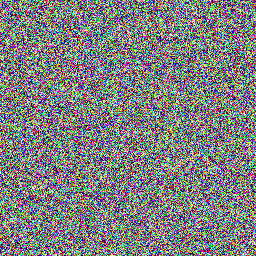

tensor(920)


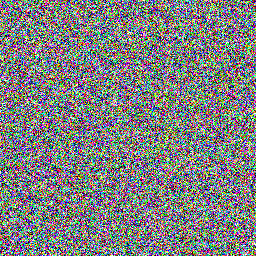

tensor(900)


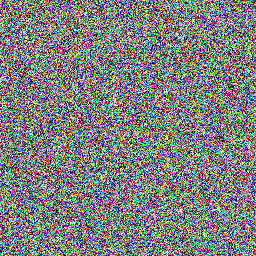

tensor(880)


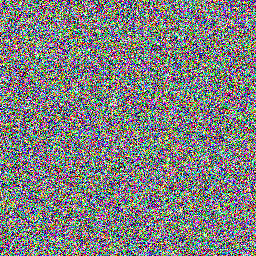

tensor(860)


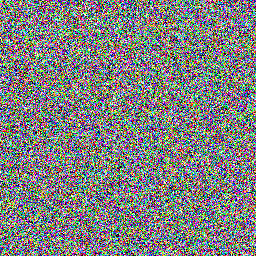

tensor(840)


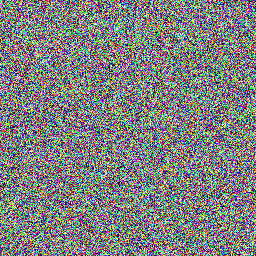

tensor(820)


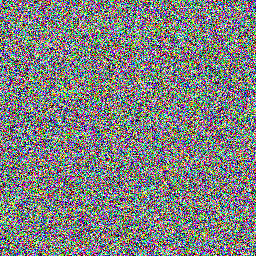

tensor(800)


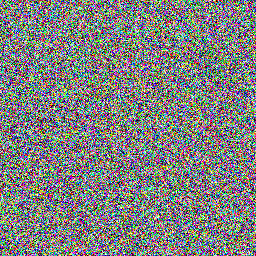

tensor(780)


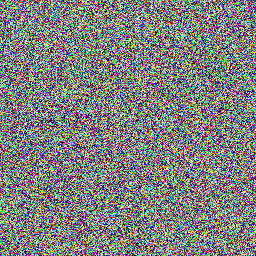

tensor(760)


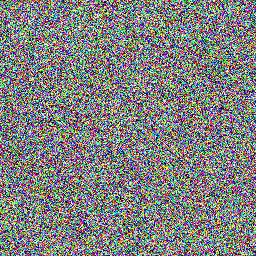

tensor(740)


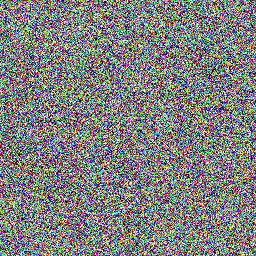

tensor(720)


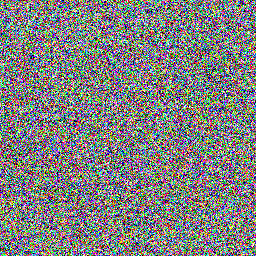

tensor(700)


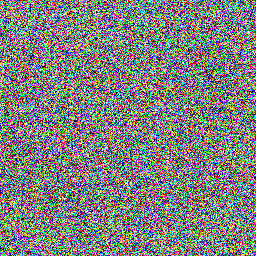

tensor(680)


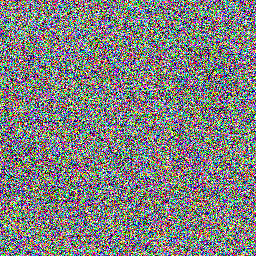

tensor(660)


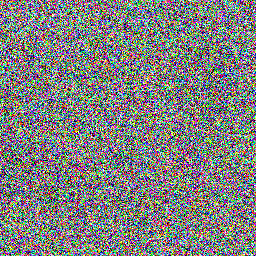

tensor(640)


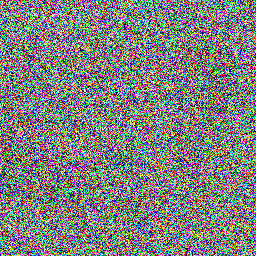

tensor(620)


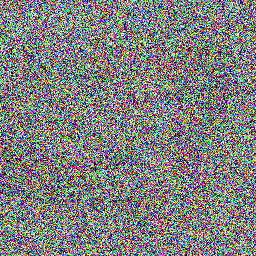

tensor(600)


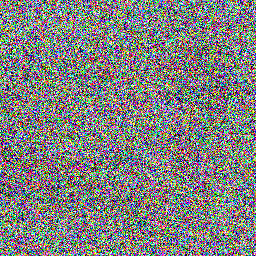

tensor(580)


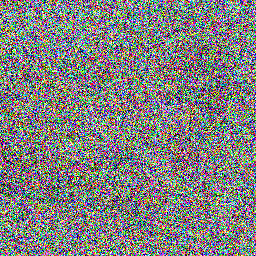

tensor(560)


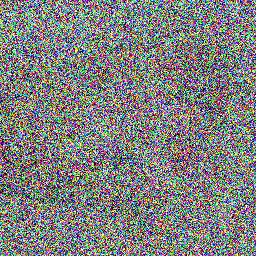

tensor(540)


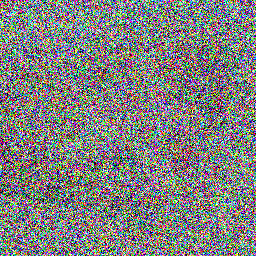

tensor(520)


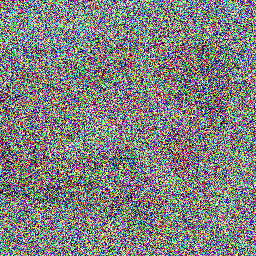

tensor(500)


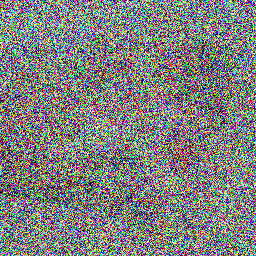

tensor(480)


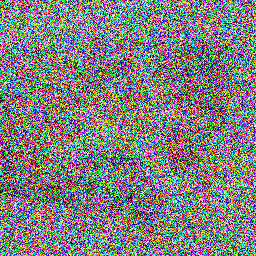

tensor(460)


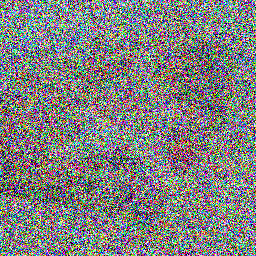

tensor(440)


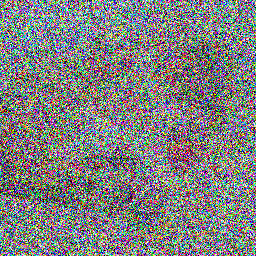

tensor(420)


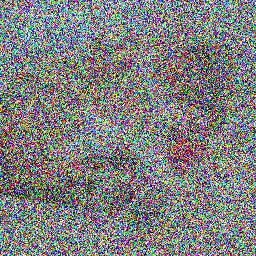

tensor(400)


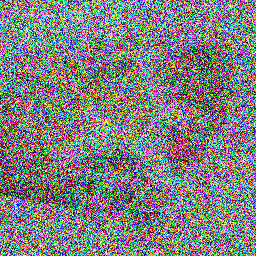

tensor(380)


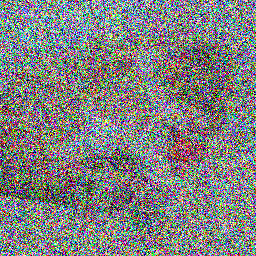

tensor(360)


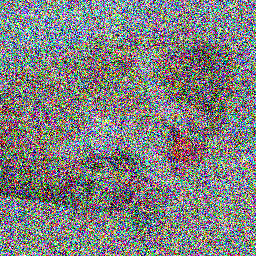

tensor(340)


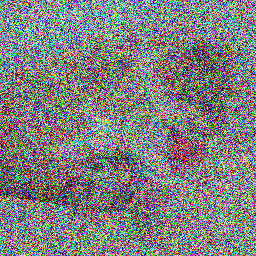

tensor(320)


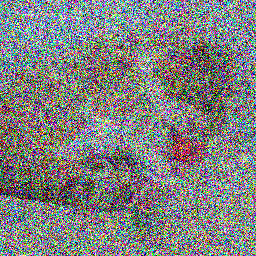

tensor(300)


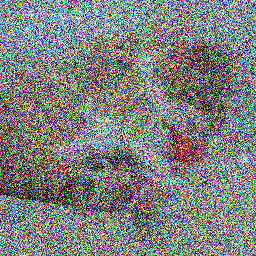

tensor(280)


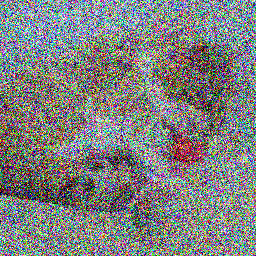

tensor(260)


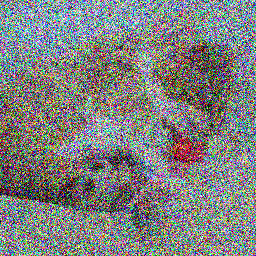

tensor(240)


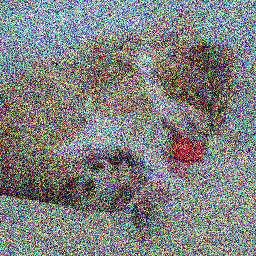

tensor(220)


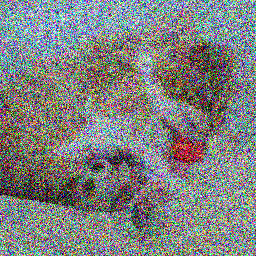

tensor(200)


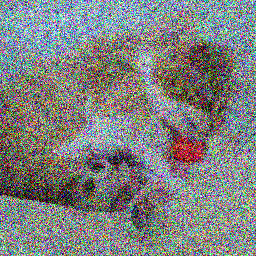

tensor(180)


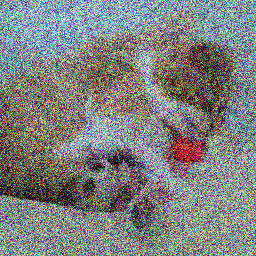

tensor(160)


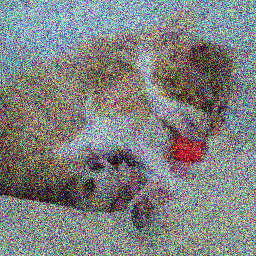

tensor(140)


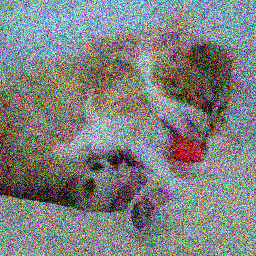

tensor(120)


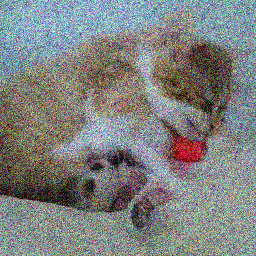

tensor(100)


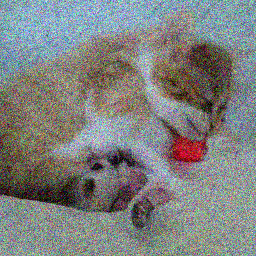

tensor(80)


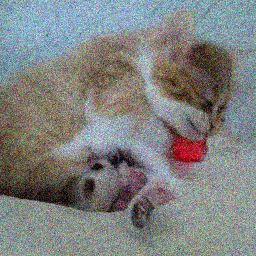

tensor(60)


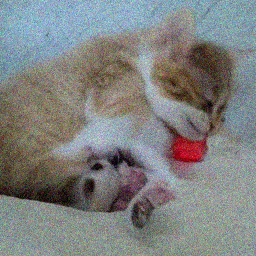

tensor(40)


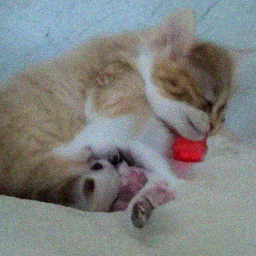

tensor(20)


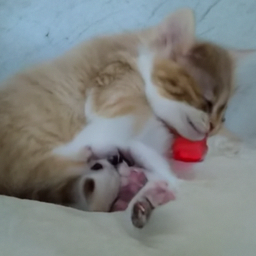

tensor(0)


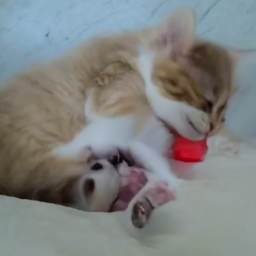

In [12]:
input = noise
print(input.shape)
for t in scheduler.timesteps:
    print(t)
    with torch.no_grad():
        noisy_residual = model(input, t).sample
    previous_noisy_sample = scheduler.step(noisy_residual, t, input).prev_sample
    input = previous_noisy_sample
    img=convert(input)
    display(img)

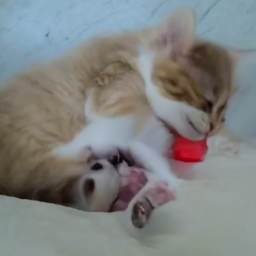

In [13]:
img=convert(input)
display(img)